# IMPORTS

In [1]:
from tqdm import tqdm
import cv2
import itertools
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import rasterio
import tensorflow as tf

DIRECTORY CONFIG

In [2]:
# === CONFIG === ## Paths & File Extensions
BASE_DIR = "chips"
IMAGE_EXT = ".tif"  # or ".png"
VERSION = 1.0

# Directory Builder Labels
L1 = "60cm"
L2 = "30cm"
L3 = VERSION
# L4 = "None Yet"
"""
SCRATCH PAD ZONE

"""
# Image Directory Names - chip children
IMAGE_DIR_1 = f"final"
IMAGE_DIR_2 = f"final_out"
# IMAGE_DIR_3 = f"None Yet"

# Input Directory
INPUT_DIR = os.path.join(BASE_DIR, IMAGE_DIR_1)

# Output Directory
OUTPUT_DIR = os.path.join(BASE_DIR, IMAGE_DIR_2)
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Predefined Test image(s) if you want TO USE THEM
sample = "image_0000.tif"
TEST_IMAGE_1 = os.path.join(INPUT_DIR, sample)
TEST_IMAGE_2 = os.path.join(OUTPUT_DIR, sample)

TEST_STOP = 3  # this is a loop stop condition used for testing throughput

In [3]:
print(INPUT_DIR,"\n", OUTPUT_DIR)
print(TEST_IMAGE_1,"\n", TEST_IMAGE_2)

chips\final 
 chips\final_out
chips\final\image_0000.tif 
 chips\final_out\image_0000.tif


# CV ENHANCEMENT MAIN

#### FINAL ENHANCEMENT - RUN THIS SECTION TO ENHANCE WITH IDEAL VALUES GATHERED IN THE RANDOM GRID SEARCH SECTION  BELOW
#### CVE FUNCTION SCOPED VARIABLES BELOW ARE CONSIDERED A GOOD BASELINE, TREAD CAREFULLY.

### RECOVERY PLAN: IF THE CHIP ENHACEMENT IS INTERRUPTED, ACTIVATE CRASH RECOVERY CELL # 1 AND FOLLOW THE INSTRUCTIONS
##### How: source and destination directories are compared and the diff is fed back into the machine.

In [4]:
# # ✅ CRASH RECOVERY CELL # 1: Selective Enhancement Resume via Filename Diff
# # ACTIVATE THE LINE IN THE NEXT CELL WITH --> "for in_path in tqdm(recovery_paths", RUN FROM THERE DOWN
#
# # Define source and destination directories
# source_dir = INPUT_DIR      # raw input chips
# dest_dir   = OUTPUT_DIR   # enhanced outputs
#
# # Get list of .tif filenames (not paths)
# source_files = {f for f in os.listdir(source_dir) if f.endswith(".tif")}
# dest_files   = {f for f in os.listdir(dest_dir)   if f.endswith(".tif")}
#
# # Compute set difference: which source images are not yet enhanced
# recovery_files = sorted(list(source_files - dest_files))
# print(f"{len(recovery_files)} images will be recovered")

In [5]:
# === IMAGE TRANSFORMATION FUNCTIONS ===
def apply_sharpening(img, alpha=10.04, aa_sigma=3.20):
    """Applies hybrid sharpening to a uint8 RGB image in [0, 255]."""
    img = img.astype(np.float32)

    # Predefined 5×5 Gaussian low-pass kernel
    discrete_g = np.array([
        [0.002969, 0.013306, 0.021938, 0.013306, 0.002969],
        [0.013306, 0.059634, 0.098320, 0.059634, 0.013306],
        [0.021938, 0.098320, 0.162103, 0.098320, 0.021938],
        [0.013306, 0.059634, 0.098320, 0.059634, 0.013306],
        [0.002969, 0.013306, 0.021938, 0.013306, 0.002969],
    ], dtype=np.float32)

    blur = cv2.filter2D(img, -1, discrete_g)
    mask = img - blur
    sharpened = cv2.GaussianBlur(img + alpha * mask, (3, 3), sigmaX=aa_sigma)

    return np.clip(sharpened, 0, 255).astype(np.uint8)


def apply_contrast(img, low_perc=2, high_perc=98):
    """Stretches contrast by remapping low/high percentiles to [0, 255]."""
    img = img.astype(np.float32)
    p_low = np.percentile(img, low_perc)
    p_high = np.percentile(img, high_perc)

    stretched = (img - p_low) / (p_high - p_low + 1e-5)
    stretched = np.clip(stretched, 0, 1)
    return (stretched * 255).astype(np.uint8)


def apply_brightness(img, gamma=1.1):
    """Adjusts brightness using gamma correction (γ > 1 = brighter)."""
    img = img.astype(np.float32) / 255.0
    corrected = np.power(img, 1 / gamma)
    return (np.clip(corrected, 0, 1) * 255).astype(np.uint8)


def apply_centering(img):
    # Placeholder – returns image as-is
    return img

# === TRANSFORM LOOP ===
for filename in tqdm(os.listdir(INPUT_DIR)): # ACTIVATE FOR NORMAL OPERATIONS ONLY
# for filename in tqdm(recovery_files, desc="Enhancing chips", unit="chip"):  # ACTIVATE FOR CRASH RECOVERY ONLY
    if not filename.lower().endswith(IMAGE_EXT):
        continue

    in_path = os.path.join(INPUT_DIR, filename)
    out_path = os.path.join(OUTPUT_DIR, filename)

    with rasterio.open(in_path) as src:

        # LOAD/# CONVERT BACK TO (H,W,C)
        array = src.read()  # Read the image data as a NumPy array (bands, height, width)
        array = np.transpose(array, (1, 2, 0))  # Transpose to (height, width, bands) for OpenCV

       # TRANSFORM
        # array = apply_sharpening(array)
        array = apply_contrast(array)
        array = apply_brightness(array)
        # array = apply_centering(array)

        # CONVERT BACK TO (C,H,W) / SAVE
        processed_array = np.transpose(array, (2, 0, 1))  # Transpose back to (bands, height, width) for Rasterio
        meta = src.meta.copy()  # Copy the metadata from the source
        meta['dtype'] = processed_array.dtype  # Update the data type if changed by CV processing

        with rasterio.open(out_path, 'w', **meta) as dst:  # Write the processed array to a new GeoTIFF
            dst.write(processed_array)
    # if TEST_STOP == 0: break  # COMMENT THIS LINE OUT WHEN NOT TESTING THROUGH PUT
    # TEST_STOP -= 1  # COMMENT THIS LINE OUT WHEN NOT TESTING THROUGH PUT


100%|██████████| 12/12 [00:00<00:00, 17.12it/s]


SPOT CHECK METADATA

In [6]:
def compare_metas(sample_geo, i, img_tup):
    with rasterio.open(sample_geo) as src:
        metadata = src.meta
        tags = src.tags()
        print(f"***********************************FOR TEST IMAGE {img_tup[i]}*******************************")
        print("Basic metadata:", metadata)
        print("Full tags (including CRS info):", tags)
        print("\n")

geo_samples = [TEST_IMAGE_1, TEST_IMAGE_2]
for i, sample in enumerate(geo_samples): compare_metas(sample, i, (1, 2))

***********************************FOR TEST IMAGE 1*******************************
Basic metadata: {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 256, 'height': 256, 'count': 3, 'crs': CRS.from_wkt('PROJCS["NAD83 / UTM zone 11N",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-117],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","26911"]]'), 'transform': Affine(0.6040459700071551, 0.0, 397667.0984895531,
       0.0, -0.6051055269374046, 3780602.305478959)}
Full tags (including CRS info): {'TIFFTAG_XRESOLU

COMPLETE METADAT CHECK
Note: runtime for 28k 256 193 KB mosiac chips is ~17 min

In [7]:
meta_count = []
for filename in os.listdir(OUTPUT_DIR):
    if filename.lower().endswith('.tif') or filename.lower().endswith('.tiff'):
        file_path = os.path.join(OUTPUT_DIR, filename)
        try:
            with rasterio.open(file_path) as src:
                tags = src.tags()
                has_metadata = bool(tags)  # True if tags are present
        except Exception as e:
            has_metadata = False
        meta_count.append(1)
print(f"Files with metadata: {sum(meta_count)}")

Files with metadata: 12


VERIFY/VISUALIZE THE CORRECTIONS

In [8]:
def is_image_different(path1, path2, mode="path"):
    img1 = None
    img2 = None

    if mode == "path":
        img1 = cv2.imread(str(path1))
        img2 = cv2.imread(str(path2))

    if mode == "chip":
        img1 = cv2.imread(str(path1))
        img2 = tf.cast(tf.squeeze(path2), tf.uint8).numpy()
        img2 = img2.astype(np.uint8)

        print(type(img1), type(img2))
    return not np.array_equal(img1, img2)

In [9]:
image_diff = []
def show_random_chip_comparisons(diff_flag=1, comparison_size=2):

    all_files = [f for f in os.listdir(OUTPUT_DIR) if f.lower().endswith(IMAGE_EXT)]
    random.shuffle(all_files)  # 💥 Restore randomness

    for file_name in tqdm(all_files[:comparison_size]):
        orig_path = os.path.join(INPUT_DIR, file_name)
        corr_path = os.path.join(OUTPUT_DIR, file_name)

        if diff_flag == 1:
            image_diff.append(is_image_different(orig_path, corr_path))

        orig = cv2.cvtColor(cv2.imread(str(orig_path)), cv2.COLOR_BGR2RGB)
        corr = cv2.cvtColor(cv2.imread(str(corr_path)), cv2.COLOR_BGR2RGB)

        fig, axs = plt.subplots(1, 2, figsize=(14, 7))
        axs[0].imshow(orig)
        axs[0].set_title(f"Original: {file_name}")
        axs[1].imshow(corr)
        axs[1].set_title("Corrected")
        for ax in axs:
            ax.axis("off")
        plt.tight_layout()
        plt.show()

    return image_diff

  0%|          | 0/3 [00:00<?, ?it/s]

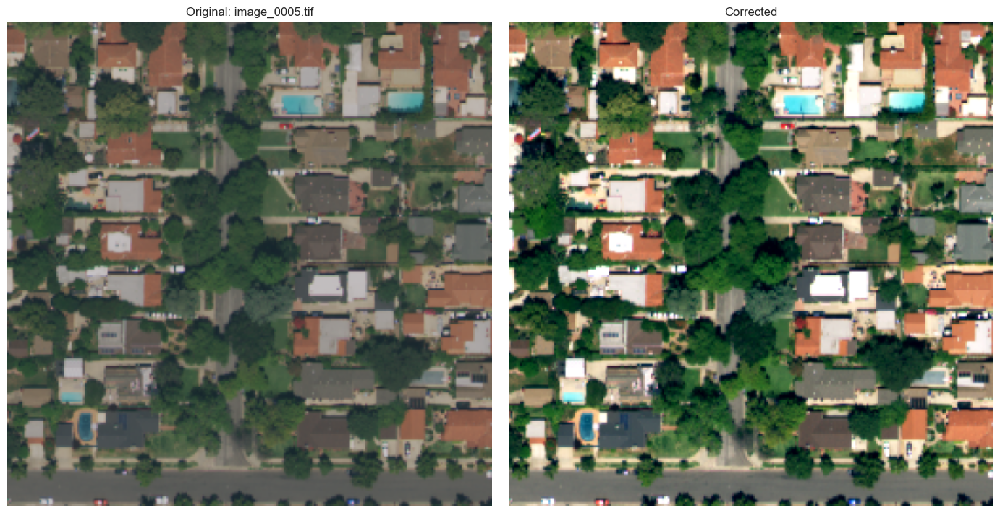

 33%|███▎      | 1/3 [00:01<00:02,  1.07s/it]

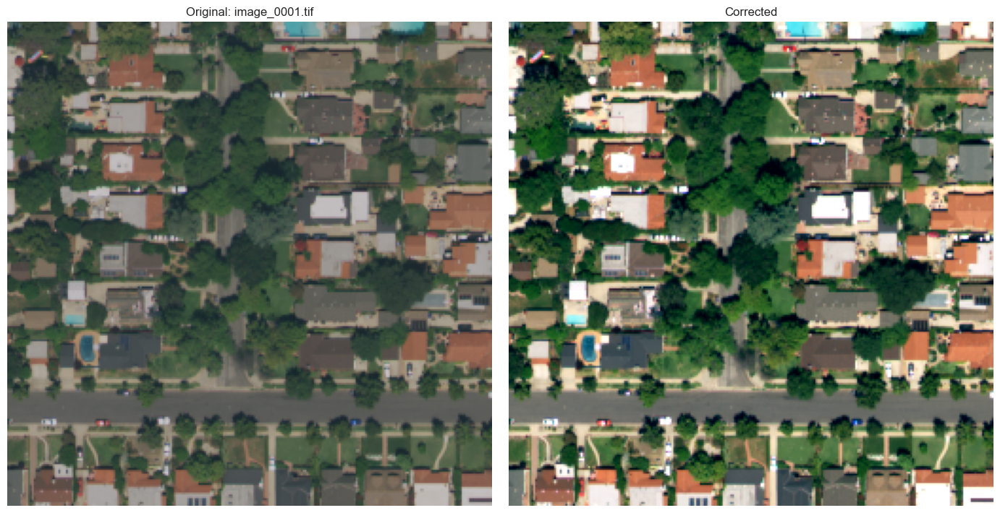

 67%|██████▋   | 2/3 [00:01<00:00,  1.13it/s]

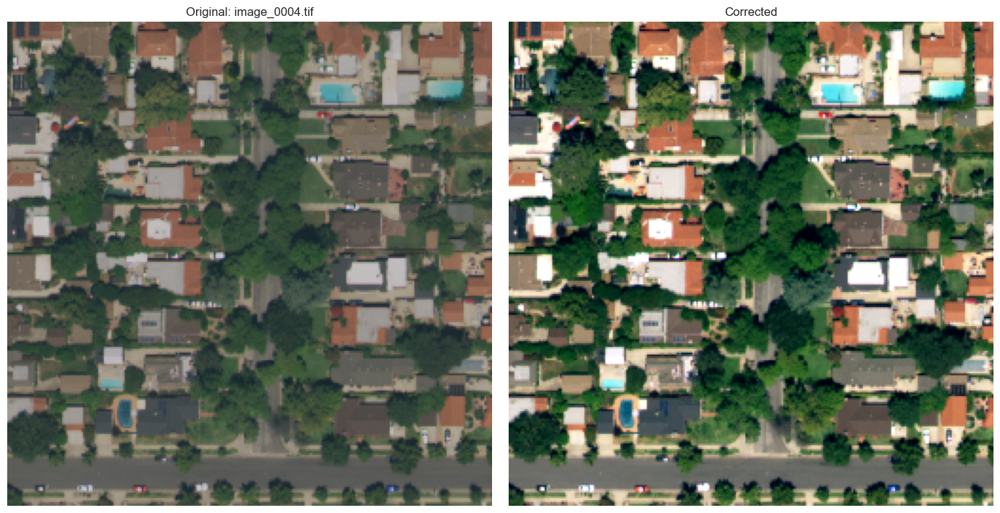

100%|██████████| 3/3 [00:02<00:00,  1.15it/s]

[True, True, True]


In [10]:
NUM_COMPARES = 3
show_random_chip_comparisons(comparison_size=NUM_COMPARES)
print(image_diff)
image_diff.clear()

# THE RANDOM GRID SEARCH SECTION

SELECTING AN IMAGE TO FACILITATE IMAGE TUNING

In [11]:
def pick_chip(mode="static", static_path=None, chip_dir=None):
    """Returns chip path based on selection mode: static or random."""
    if mode == "static":
        assert static_path is not None, "Static path required for mode='static'"
        return static_path
    elif mode == "random":
        assert chip_dir is not None, "chip_dir required for mode='random'"
        files = [f for f in os.listdir(chip_dir) if f.lower().endswith(IMAGE_EXT)]
        return os.path.join(chip_dir, random.choice(files))
    else:
        raise ValueError("mode must be 'static' or 'random'")

In [12]:
# Optional: Toggle static selection
img_path = pick_chip(
    mode="random",  # <---just comment out his line to switch to static mode
    static_path=TEST_IMAGE_1,
    chip_dir=INPUT_DIR
)

CVE QUICK  SECTION  - RUN THE NEXT 2 CELLS IF YOU JUST WANT TO RUN EXPERIMENTS ON A SINGLE IMAGE DECLARED AS TEST_# IN CONFIG
THIS WHERE YOU DO YOUR FINAL TUNING AS YOU NEAR YOUR OPTIMAL SETTINGS.  YOU CAN TEST STATIC OR RANDOM SELECTION


In [13]:
# ## QUICK LOOK
# === IMAGE TRANSFORMATION FUNCTIONS ===
def apply_sharpening(img, alpha=10.04, aa_sigma=3.20):
    """Applies hybrid sharpening to a uint8 RGB image in [0, 255]."""
    img = img.astype(np.float32)

    # Predefined 5×5 Gaussian low-pass kernel
    discrete_g = np.array([
        [0.002969, 0.013306, 0.021938, 0.013306, 0.002969],
        [0.013306, 0.059634, 0.098320, 0.059634, 0.013306],
        [0.021938, 0.098320, 0.162103, 0.098320, 0.021938],
        [0.013306, 0.059634, 0.098320, 0.059634, 0.013306],
        [0.002969, 0.013306, 0.021938, 0.013306, 0.002969],
    ], dtype=np.float32)

    blur = cv2.filter2D(img, -1, discrete_g)
    mask = img - blur
    sharpened = cv2.GaussianBlur(img + alpha * mask, (3, 3), sigmaX=aa_sigma)

    return np.clip(sharpened, 0, 255).astype(np.uint8)


def apply_contrast(img, low_perc=2, high_perc=98):
    """Stretches contrast by remapping low/high percentiles to [0, 255]."""
    img = img.astype(np.float32)
    p_low = np.percentile(img, low_perc)
    p_high = np.percentile(img, high_perc)

    stretched = (img - p_low) / (p_high - p_low + 1e-5)
    stretched = np.clip(stretched, 0, 1)
    return (stretched * 255).astype(np.uint8)


def apply_brightness(img, gamma=1.1):
    """Adjusts brightness using gamma correction (γ > 1 = brighter)."""
    img = img.astype(np.float32) / 255.0
    corrected = np.power(img, 1 / gamma)
    return (np.clip(corrected, 0, 1) * 255).astype(np.uint8)


def apply_centering(img):
    # Placeholder – returns image as-is
    return img

# === TUNING GRID SEARCH FUNCTION ===
def cv_tuning_single_image(img_path, custom_min=4.5):
    # Read and convert the image
    img_raw = cv2.imread(img_path)
    img_raw = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

    # Final fixed parameter example
    final_params = {
        "alpha": 1.25,
        "aa_sigma": 1.5,
        "low_perc": 3.0,
        "high_perc": 97.25,
        "gamma": 0.9,
    }

    # Apply transformations
    img = img_raw.copy()
    # img = apply_sharpening(img, final_params["alpha"], final_params["aa_sigma"])
    img = apply_contrast(img, final_params["low_perc"], final_params["high_perc"])
    img = apply_brightness(img, final_params["gamma"])

    # Create a figure
    figsize = (custom_min, custom_min)
    fig, ax = plt.subplots(figsize=figsize)

    # Plot the resulting image
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(
        f"{os.path.basename(img_path)}\nα:{final_params['alpha']}/σ:{final_params['aa_sigma']} | "
        f"C:{final_params['low_perc']}/{final_params['high_perc']} | Γ:{final_params['gamma']}",
        fontsize=12
    )
    plt.tight_layout()
    plt.show()


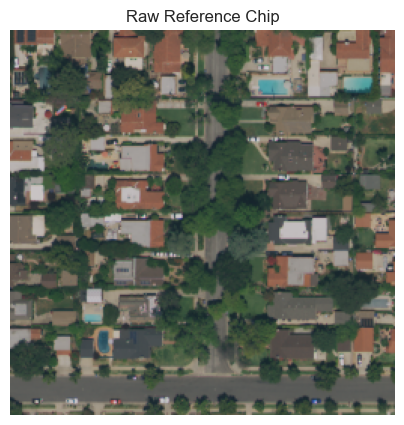

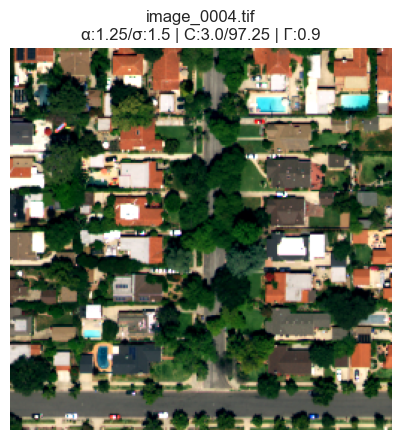

In [14]:
## REFERENCE OUTPUT ABOVE
ref_img = cv2.imread(img_path)
ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5, 5))
plt.imshow(ref_img)
plt.title("Raw Reference Chip")
plt.axis("off")
plt.show()

# SINGLE SAMPLE OUTPUT ---
for x in range(1):
    cv_tuning_single_image(
        img_path=img_path
    )

FULL RANDOM GRID SEARCH - TO FIND "ENHANCEMENT FUNCTION SCOPE" VARIABLE VALUES THAT IMPACT IMAGE QUALITY
EVEN THOUGH THIS SECTION IS MEANT FOR BROAD EXPLORATION, YOU CAN DO DELICATE WORK HERE TOO

In [15]:
## ACTUAL GRID SEARCH
# === TRANSFORM FUNCTIONS WITH PARAMS AS ARGUMENTS ===
# === IMAGE TRANSFORMATION FUNCTIONS ===
def apply_sharpening(img, alpha=10.04, aa_sigma=3.20):
    """Applies hybrid sharpening to a uint8 RGB image in [0, 255]."""
    img = img.astype(np.float32)

    # Predefined 5×5 Gaussian low-pass kernel
    discrete_g = np.array([
        [0.002969, 0.013306, 0.021938, 0.013306, 0.002969],
        [0.013306, 0.059634, 0.098320, 0.059634, 0.013306],
        [0.021938, 0.098320, 0.162103, 0.098320, 0.021938],
        [0.013306, 0.059634, 0.098320, 0.059634, 0.013306],
        [0.002969, 0.013306, 0.021938, 0.013306, 0.002969],
    ], dtype=np.float32)

    blur = cv2.filter2D(img, -1, discrete_g)
    mask = img - blur
    sharpened = cv2.GaussianBlur(img + alpha * mask, (3, 3), sigmaX=aa_sigma)

    return np.clip(sharpened, 0, 255).astype(np.uint8)


def apply_contrast(img, low_perc=2, high_perc=98):
    """Stretches contrast by remapping low/high percentiles to [0, 255]."""
    img = img.astype(np.float32)
    p_low = np.percentile(img, low_perc)
    p_high = np.percentile(img, high_perc)

    stretched = (img - p_low) / (p_high - p_low + 1e-5)
    stretched = np.clip(stretched, 0, 1)
    return (stretched * 255).astype(np.uint8)


def apply_brightness(img, gamma=1.1):
    """Adjusts brightness using gamma correction (γ > 1 = brighter)."""
    img = img.astype(np.float32) / 255.0
    corrected = np.power(img, 1 / gamma)
    return (np.clip(corrected, 0, 1) * 255).astype(np.uint8)


def apply_centering(img):
    # Placeholder – returns image as-is
    return img

# === TUNING GRID SEARCH FUNCTION ===
def cv_tuning_grid_search(img_path,
                          alphaz=np.linspace(1.35, 1.45, 5),
                          aa_sigmas=np.linspace(1.85, 1.95, 5),
                          low_percs = np.linspace(1, 3, 5),
                          high_percs = np.linspace(97, 99, 5),
                          gammas = np.linspace(1.0, 1.2, 5),
                          grid_shape=(2, 2), foo=4):

    img_raw = cv2.imread(img_path)
    img_raw = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

    # Build grid combos
    grid = list(itertools.product(alphaz, aa_sigmas, low_percs, high_percs, gammas))
    random.shuffle(grid)  # Optional
    n_combos = len(grid)
    n_rows, n_cols = grid_shape

    # This section supports a gentle transition from generating grids of single images with varied transforms to grids of varied images with a single set of transforms applied
    if n_rows * n_cols > n_combos:
        print("[!] Not enough parameter combos for the requested grid layout.")
        print(f"    Requested: {n_rows*n_cols}, Available combos: {n_combos}")

        # FALLBACK: Random Image Grid using Final Parameters
        final_params = {
            "alpha": 1.25,
            "aa_sigma": 1.5,
            "low_perc": 3.0,
            "high_perc": 97.25,
            "gamma": 0.9,
        }

        image_files = [
            os.path.join(INPUT_DIR, f) for f in os.listdir(INPUT_DIR)
            if f.lower().endswith(('.tif', '.tiff', '.png', '.jpeg', '.jpg'))
        ]
        selected_images = random.sample(image_files, n_rows * n_cols)

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
        axes = axes.flatten()

        for idx, img_file in enumerate(selected_images):
            img_raw = cv2.imread(img_file)
            img = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

            # Apply final params
            # img = apply_sharpening(img, final_params["alpha"], final_params["aa_sigma"])
            img = apply_contrast(img, final_params["low_perc"], final_params["high_perc"])
            img = apply_brightness(img, final_params["gamma"])

            axes[idx].imshow(img)
            axes[idx].axis("off")
            axes[idx].set_title(f"{os.path.basename(img_file)}", fontsize=8)

        plt.suptitle(f"Final Param Random Grid\nα:{final_params['alpha']} | "
                     f"σ:{final_params['aa_sigma']} | "
                     f"C:{final_params['low_perc']}–{final_params['high_perc']} | "
                     f"Γ:{final_params['gamma']}", fontsize=14)
        plt.tight_layout()
        plt.show()
        return

    base_size = 1  # baseline scaling factor
    min_size = foo# minimum figure width/height
    figsize = (max(base_size * n_cols, min_size), max(base_size * n_rows, min_size))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)

    # fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
    axs = axes.flatten()

    for idx, (alpha, sigma, low_perc, high_perc, gamma) in enumerate(grid[:n_rows * n_cols]):
        img = img_raw.copy()
        img = apply_sharpening(img, alpha=alpha, aa_sigma=sigma)
        img = apply_contrast(img, low_perc=low_perc, high_perc=high_perc)
        img = apply_brightness(img, gamma=gamma)

        axs[idx].imshow(img, interpolation='none')
        axs[idx].axis('off')
        axs[idx].set_title(f" Alpha:{alpha:.3f}| AA-Sigma:{sigma:.3f}  | C:low-{low_perc:.3f} high-{high_perc:.3f}| Gamma:{gamma:.3f}", fontsize=8)

    plt.suptitle(f"CV Enhancement Results: sample = {os.path.basename(img_path)}", fontsize=14)
    plt.tight_layout()
    plt.show()


In [16]:
# # Optional: Toggle static selection
# img_path = pick_chip(
#     mode="random",  # or "static" <---just comment out his line
#     static_path=TEST_IMAGE_1,
#     chip_dir=INPUT_DIR
# )
# 
# n_value = 3 # or 5 or 8 or any square-friendly value
# for x in range(1):
#     cv_tuning_single_image(
#         img_path=img_path,
#     )

In [17]:
# ImageTuning
# === Parameter Ranges (Final Refined Bracket) ===
ALPHA_START = 0.01  # Lower end for subtle sharpening
ALPHA_STOP = 0.1  # Upper end for slightly stronger sharpening
ALPHA_STEPS = 5

AAS_START = 0.25    # Lower end for Anti Alias Sigma
AAS_STOP = 0.75     # Upper end for slightly stronger smoothing
AAS_STEPS = 5

LOW_PERC_START = 2.75
LOW_PERC_STOP = 3.25
LOW_PERC_STEPS = 3

HIGH_PERC_START = 94.75
HIGH_PERC_STOP = 96.25
HIGH_PERC_STEPS = 3

GAMMA_START = 0.875    # Narrowed range for Gamma
GAMMA_STOP = 0.925     # Slightly brighter or darker range
GAMMA_STEPS = 3

# === Final Linspaces for Grid Search ===
ALPHAS = np.linspace(ALPHA_START, ALPHA_STOP, ALPHA_STEPS)
AAS = np.linspace(AAS_START, AAS_STOP, AAS_STEPS)
GAMMAS = np.linspace(GAMMA_START, GAMMA_STOP, GAMMA_STEPS)
LOW_PERCS = np.linspace(LOW_PERC_START, LOW_PERC_STOP, LOW_PERC_STEPS)
HIGH_PERCS = np.linspace(HIGH_PERC_START, HIGH_PERC_STOP, HIGH_PERC_STEPS)

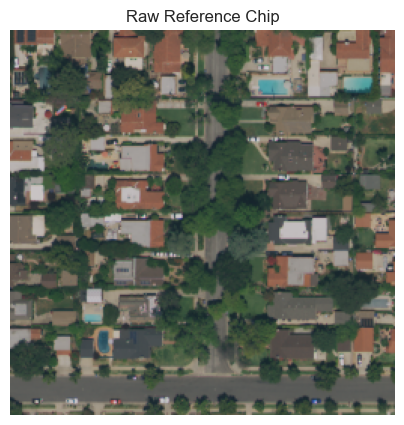

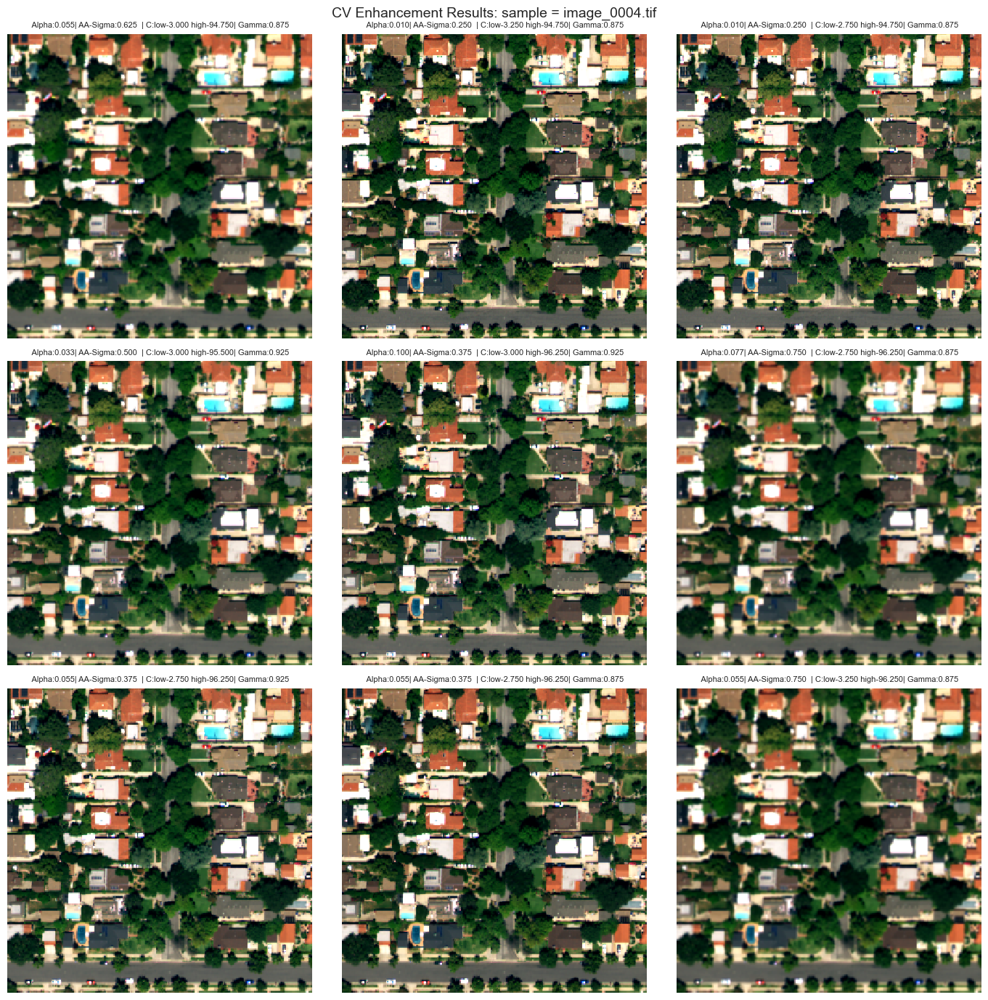

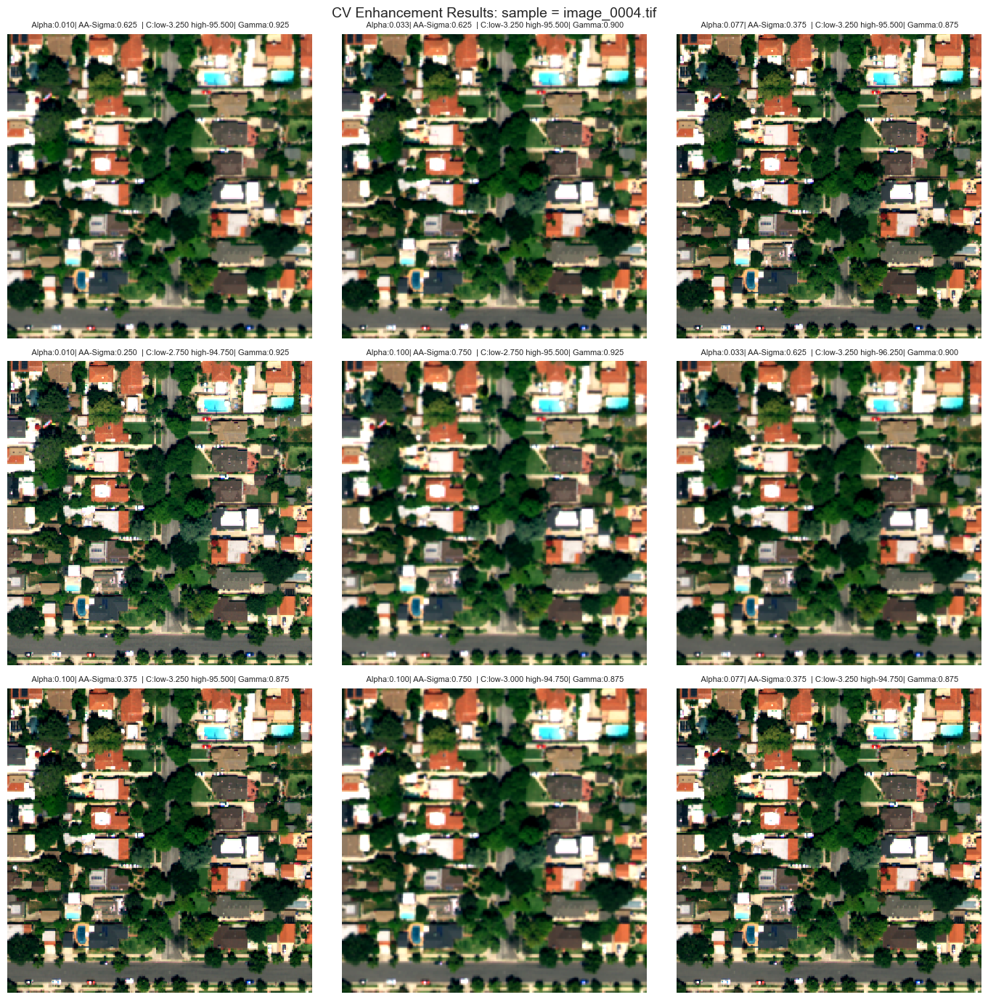

In [18]:
# ## REFERENCE OUTPUT 
ref_img = cv2.imread(img_path)
ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(5, 5))
plt.imshow(ref_img)
plt.title("Raw Reference Chip")
plt.axis("off")
plt.show()


#---RANDOM GRID SEARCH EXECUTION ---
n_value = 3  # or 5 or 8 or any square-friendly value  
for x in range(2): ## <--- YOU CAN STACK STACK SOME GRIDS IF YOU WANT...DONT GET TOO  CRAZY...1 for 1 grid
    cv_tuning_grid_search(
        img_path=img_path,
        alphaz=ALPHAS,
        aa_sigmas=AAS,
        low_percs = LOW_PERCS,
        high_percs = HIGH_PERCS,
        gammas = GAMMAS,
        grid_shape=(n_value, n_value),
        foo=14
    )

In [19]:
# ## REFERENCE OUTPUT BELOW IF NEEDED
# ref_img = cv2.imread(img_path)
# ref_img = cv2.cvtColor(ref_img, cv2.COLOR_BGR2RGB)
# 
# plt.figure(figsize=(5, 5))
# plt.imshow(ref_img)
# plt.title("Raw Reference Chip")
# plt.axis("off")
# plt.show()

# END OF FILE